When using the GPT API, you should use the following message template:

In [1]:
# "messages": [{"role": "system", "content": "You are a polite and helpful chatbot robot. Provide accurate answers to the questions asked to you."},
#              {"role": "user", "content": "What's the capital of France?"},
#              {"role": "assistant", "content": "Paris"}]

# System: the instructions you give to the model.
# User: the question asked by the user or the text provided to the model.
# Assistant: the response generated by the model to the text provided by the user.

In [2]:
!pip install --upgrade openai

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 328.5/328.5 kB 10.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 75.6/75.6 kB 12.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 77.9/77.9 kB 11.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 58.3/58.3 kB 9.3 MB/s eta 0:00:00


## Login Openai Key

In [3]:
import os
from google.colab import userdata

os.environ["OPENAI_API_KEY"] = userdata.get("openai_key")

In [4]:
from openai import OpenAI

client = OpenAI()

## SQL Translate

In [8]:
system="""You are a Microsoft SQL expert. Answer the questions asked to you in the most accurate way.
Microsoft SQL tables, with their properties:
Employee(id, name, department_id)
Department(id, name, address)
Sales_amount(id, employee_id, amount, date)"""

user = "write a query to list the names of employees whose total sales in the last 3 months have been more than 10 thousand EURO."

In [9]:
response = client.chat.completions.create(
    model = "gpt-4o",
    messages = [
        {"role": "system", "content": f"{system}"},
        {"role": "user", "content": f"{user}"}
    ],
    temperature = 0,
    top_p = 1,
    max_tokens = 500,
    frequency_penalty = 0,
    presence_penalty = 0
)


# Max_tokens parametresi, modelin yanıtında üretebileceği maksimum token sayısını gösterir.
# Eğer token sayısı yetersizse, bunu artırabilirsiniz.

# GPT modellerinde, temperature parametresi çıktının rastgeleliğini/öngörülebilirliğini kontrol eder. Bu değer 0 ile 2 arasında ayarlanabilir;
# 0 en öngörülebilir/olası çıktıyı üretirken, 2 en rastgele/tahmin edilemeyen çıktıyı üretir. Temperature 0 olarak ayarlandığında,
# GPT her zaman en yüksek olasılığa sahip cevabı seçer. temperature parametresi 2 olarak ayarlandığında çıktının rastgeleliği artar ve
# çıktının öngörülebilirliği önemli ölçüde azalır. Ancak, önerilen temperature değeri MAX 0.8 civarındadır.

# temperature örneği:

# "Kahramanımız kılıcıyla ejderhayı ..... " cümlesindeki boşluğu doldurabilecek kelimelerin olasılıkları şu şekilde varsayalım: %40 öldürdü, %30 yendi,
# %20 yaraladı, %7 korkuttu ve %3 öptü. Eğer temperature çok düşük değerlere, örneğin 0 veya 0.1'e ayarlanırsa, model en olası kelime olan "öldürdü"yü bir
# sonraki kelime olarak seçer. temperature düşük değerlere, örneğin 0.2 veya 0.3'e ayarlanırsa, model en olası kelimeler olan "öldürdü" veya "yendi"yi
# bir sonraki kelime olarak seçer. 2 civarındaki değerler seçilirse, model bir sonraki kelime olarak en düşük olasılıklar dahil rastgele tüm olası
# kelimelerden birini seçebilir.

# GPT modellerinde top_p parametresi, model tarafından üretilecek output için kullanılacak tokenlerin/kelimelerin ne kadar çeşitli şekillerde seçileceğini
# belirler. 0 ile 1 arasında değer alır.

# 1 olduğunda output için tüm olası tokenler kullanılabilirken, değer küçüldükçe kullanılabilecek tokenlerin çeşitliliği de azalacaktır.

# Top_p örneği:

# Eğer top_p değeri yukarıdaki örnek cümle için 0.7 olarak ayarlanırsa, bir sonraki kelimeyi kümülatif olasılık toplamları 0.7'yi
# aşmayan kelimelerden seçecektir (0.4 öldürdü, 0.3 yendi) veya (0.4 öldürdü, 0.2 yaraladı, 0.07 korkuttu, 0.03 öptü).

# Eğer top_p değeri yukarıdaki örnek cümle için 0.65 olarak ayarlanırsa, bir sonraki kelimeyi kümülatif olasılık toplamları 0.65'i
# aşmayan kelimelerden seçecektir. (0.4 öldürdü, 0.2 yaraladı, 0.03 öptü) veya (0.3 yendi, 0.2 yaraladı, 0.07 korkuttu, 0.03 öptü).

# Eğer top_p değeri yukarıdaki örnek cümle için 0.26 olarak ayarlanırsa, bir sonraki kelimeyi kümülatif olasılık toplamları 0.26'ı
# aşmayan kelimelerden seçecektir. (0.2 yaraladı, 0.03 öptü).

# Eğer top_p değeri sıfır olarak ayarlanırsa, tokenlerin kümülatif olasılık toplamları hiçbir zaman sıfır olmayacağından model yalnızca
# en yüksek olasılığa sahip tokeni seçer

# Hem top_p'yi 1 (maksimum) hem de sıcaklığı 2 (maksimum) olarak ayarlamak çıktının rastgeleliğini büyük ölçüde artırabilir, bu nedenle çıktının kalitesi
# çok düşük olabilir.

# ÖNEMLİ NOT:

# OpenAI tarafından önerilen, top_p'nin her zaman 1 ve temperature'ın 0 olarak ayarlanmasıdır. Çıktının rastgeleliği artırılmak isteniyorsa, top_p
# parametresi 1'de sabitlenerek sadece temperature hiper-parametresi ile oynanması önerilir.

# Frequency penalty ve presence penalty

# Frequency penalty ve presence penalty -2 ile +2 arasında değer alabilir, bunların 0.1 ile 1 arasındaki değerlerin kullanılması önerilir.

# Pozitif değerler: "Frequency penalty", bir kelimenin textdeki kullanım sayısı arttıkça o kelimenin tekrar seçilme olasılığını azaltırken,
# "presence penalty",  bir kelime textde kullanılmışsa o kelimenin tekrar seçilme olasılığını azaltır. Diğer bir deyişle, "presence penalty",
# bir kelimenin ne kadar sık kullanıldığını değil, sadece metinde var olup olmadığını dikkate alır. Eğer metinde varsa, tekrar seçilme olasılığı çok düşüktür.

# Negatif değerler: "Frequency penalty", bir kelimenin kullanım sayısı arttıkça tekrar seçilme olasılığını artırırken, "presence penalty", bir kelime
# önceden kullanılmışsa bile tekrar seçilme olasılığını artırır.



# The max_tokens parameter indicates the maximum number of tokens the model can generate in its response.
# If the number of tokens is insufficient, you can increase it.

# For GPT models, the temperature parameter controls the randomness/predictability of the output. This value can be set between 0 and 2;
# 0 produces the most predictable/probable output, while 2 produces the most random/unpredictable output. When Temperature is set to 0,
# GPT always chooses the answer with the highest probability. When temperature is set to 2, the randomness of the output increases and
# The predictability of the output is significantly reduced. However, the recommended temperature value MAX is around 0.8.

# temperature example:

# "Our hero with his sword slays the dragon ..... ", let's assume that the probabilities of words that can fill the blank in the sentence are as follows: 40% killed, 30% defeated,
# wounded 20%, scared 7% and kissed 3%. If the temperature is set to very low values, e.g. 0 or 0.1, the model will interpret the most likely word "killed" as a
# If temperature is set to low values, e.g. 0.2 or 0.3, the model selects "killed" or "defeated" as the most likely words.
# is selected as the next word. If values around 2% are chosen, the model randomly selects all possible words as the next word, including the lowest probabilities.
# can choose one of the words.

# In GPT models, the top_p parameter specifies how diverse the tokens/words to be used for the output produced by the model will be.
# It takes a value between 0 and 1.

# When 1, all possible tokens can be used for the output, while the smaller the value, the smaller the variety of tokens that can be used.

# Top_p example:

# If the top_p value is set to 0.7 for the example sentence above, the next word will have a cumulative probability sum of 0.7.
# from words that do not exceed (0.4 killed, 0.3 beat) or (0.4 killed, 0.2 injured, 0.07 scared, 0.03 kissed).

# If the top_p value is set to 0.65 for the example sentence above, it will select the next word with cumulative probability sums exceeding 0.65
# from words that do not exceed (0.4 killed, 0.2 injured, 0.03 kissed) or (0.3 beat, 0.2 injured, 0.07 scared, 0.03 kissed).

# If the value of top_p is set to 0.26 for the example sentence above, it will select the next word with a cumulative probability sum of 0.26.
# from words that do not exceed (0.2 wounded, 0.03 kissed).

# If the value of top_p is set to zero, the model will only be able to select tokens if the cumulative probability sums of the tokens are
# selects the token with the highest probability

# Setting both top_p to 1 (max) and temperature to 2 (max) can greatly increase the randomness of the output, hence the quality of the output
# may be too low.

# IMPORTANT NOTE:

# OpenAI recommends always setting top_p to 1 and temperature to 0. If you want to increase the randomness of the output, set top_p
# It is recommended to play only with the temperature hyper-parameter, fixing the # parameter at 1.

# Frequency penalty and presence penalty

# Frequency penalty and presence penalty can take values between -2 and +2, it is recommended to use values between 0.1 and 1.

# Positive values: "Frequency penalty" reduces the probability of a word being selected again as the number of times it is used in the text increases,
# "presence penalty" reduces the probability of a word being selected again if it is used in the text. In other words, "presence penalty",
# does not take into account how often a word is used, only whether it is present in the text. If it is present in the text, it is very unlikely to be selected again.

# Negative values: "frequency penalty" increases the probability of a word being selected again as the number of times it is used increases, while "presence penalty" increases the probability
# increases the likelihood of re-election even if it has been used before.


In [10]:
response
# The model completed the response process smoothly, and finish_reason was returned as 'stop'

ChatCompletion(id='chatcmpl-9jj5MdqM3rzJXJ2nHgPkqaF3Fz1AA', choices=[Choice(finish_reason='stop', index=0, logprobs=None, message=ChatCompletionMessage(content='To list the names of employees whose total sales in the last 3 months have been more than 10 thousand EURO, you can use the following SQL query:\n\n```sql\nSELECT e.name\nFROM Employee e\nJOIN Sales_amount sa ON e.id = sa.employee_id\nWHERE sa.date >= DATEADD(month, -3, GETDATE())\nGROUP BY e.id, e.name\nHAVING SUM(sa.amount) > 10000\n```\n\nThis query joins the Employee and Sales_amount tables on the employee_id, filters the sales data for the last 3 months using the DATEADD function, groups the results by employee id and name, and then calculates the total sales amount for each employee. Finally, it filters out the employees whose total sales amount is more than 10,000 EURO.', role='assistant', function_call=None, tool_calls=None))], created=1720685096, model='gpt-3.5-turbo-0125', object='chat.completion', service_tier=None, 

In [12]:
print(response.choices[0].message.content)

To list the names of employees whose total sales in the last 3 months have been more than 10 thousand EURO, you can use the following SQL query:

```sql
SELECT e.name
FROM Employee e
JOIN Sales_amount sa ON e.id = sa.employee_id
WHERE sa.date >= DATEADD(month, -3, GETDATE())
GROUP BY e.id, e.name
HAVING SUM(sa.amount) > 10000
```

This query joins the Employee and Sales_amount tables on the employee_id, filters the sales data for the last 3 months using the DATEADD function, groups the results by employee id and name, and then calculates the total sales amount for each employee. Finally, it filters out the employees whose total sales amount is more than 10,000 EURO.


## Methods of Obtaining The Desired Response From The GPT API:

### 1.You should clearly and simply specify our instructions to the system.

Zero-Shot Training

In [14]:
system = """You are a Microsoft SQL expert. Answer the questions asked to you in the most accurate way and only return SQL query.
Microsoft SQL tables, with their properties:
Employee(id, name, department_id)
Department(id, name, address)
Sales_amount(id, employee_id, amount, date)"""

user = "write a query to list the names of employees whose total sales in the last 3 months have been more than 10 thousand EURO."

response = client.chat.completions.create(
    model = "gpt-4o",
    messages = [
        {"role": "system", "content": f"{system}"},
        {"role": "user", "content": f"{user}"}],
    temperature = 0,
    top_p = 1,
    max_tokens=500,
    presence_penalty=0,
    frequency_penalty=0
)

print(response.choices[0].message.content)

```sql
SELECT e.name
FROM Employee e
JOIN Sales_amount s ON e.id = s.employee_id
WHERE s.date >= DATEADD(MONTH, -3, GETDATE())
GROUP BY e.id, e.name
HAVING SUM(s.amount) > 10000;
```


### 2.You should show examples to the model.

One-Shot Training

In [18]:
system="""You are a Microsoft SQL expert. Answer the questions asked to you in the most accurate way and only return SQL query.
Microsoft SQL tables, with their properties:
Employee(id, name, department_id)
Department(id, name, address)
Sales_amount(id, employee_id, amount, date)"""

user1 = "write a query to list the names of the employees who live in Ankara"

assistant = """SELECT Employee.name
FROM Employee
JOIN Department
ON Employee.department_id = Department.id
WHERE Department.address = 'Ankara';"""

user2 = "write a query to list the names of employees whose total sales in the last 3 months have been more than 10 thousand EURO."

In [19]:
response = client.chat.completions.create(
    model = "gpt-4o",
    messages = [
        {"role": "system", "content": f"{system}"},
        {"role": "user", "content": f"{user1}"},
        {"role": "assistant", "content": f"{assistant}"},
        {"role": "user", "content": f"{user2}"}],
    temperature=0,
    top_p = 1,
    max_tokens = 500,
    frequency_penalty=0,
    presence_penalty=0
)

In [20]:
print(response.choices[0].message.content)

```sql
SELECT E.name
FROM Employee E
JOIN Sales_amount S
ON E.id = S.employee_id
WHERE S.date >= DATEADD(MONTH, -3, GETDATE())
GROUP BY E.name
HAVING SUM(S.amount) > 10000;
```


## Automate With a Function

In [21]:
system="""You are a Microsoft SQL expert. Answer the questions asked to you in the most accurate way and just return SQL query, don't explain query.
Microsoft SQL tables, with their properties:
Employee(id, name, department_id)
Department(id, name, address)
Sales_amount(id, employee_id, amount, date)"""

user="write a query to list the names of employees whose total sales in the last 3 months have been more than 10 thousand EURO."

In [6]:
def chat_model(system, user, model="gpt-4o", temperature=0, top_p=1, max_tokens=500, presence_penalty=0, frequency_penalty=0):
  import openai

  response = client.chat.completions.create(
  model = model,
  messages = [
      {"role": "system", "content": f"{system}"},
      {"role": "user", "content": f"{user}"}],
  temperature=temperature,
  top_p=top_p,
  max_tokens=max_tokens,
  presence_penalty=presence_penalty,
  frequency_penalty=frequency_penalty)

  return response.choices[0].message.content


# We will use the chat_model() function for the following examples because it is more practical and understandable.

In [7]:
from IPython.display import Markdown
Markdown(chat_model(system, user))

Negative

## Explain Code

In [24]:
system = "You are a python 3 expert. Explain the codes asked to you in the most accurate way."
user = """Explain of what the fallowing code does

def remove_common_prefix(x, prefix, ws_prefix):
    x["completion"] = x["completion"].str[len(prefix) :]
    if ws_prefix:
        # keep the single whitespace as prefix
        x["completion"] = " " + x["completion"]
return x"""

In [25]:
user
# Kodlardaki boşluklar ve satırlar modelin bir kodlamayı anlaması açısından çok önemlidir. Bu nedenle modele beslediğimiz kod bloklarını tanımlamak için
# üçlü tırnak kullanacağız, böylece model boşlukların ve yeni satırların nerede kullanıldığını anlayabilir. Bunu tek veya çift tırnak işaretleri ile de
# yapabilirsiniz ancak tüm boşlukları ve yeni satırları kendinizin tanımlaması gerekecektir. Bu, tahmin edebileceğiniz gibi çok yorucu ve zaman alıcı
# bir iştir.

# Spaces and lines in the code are very important for the model to understand an encoding. Therefore, to define the code blocks we feed to the model
# We will use triple quotes so that the model can understand where spaces and new lines are used. You can also do this with single or double quotes
# but you will have to define all the spaces and new lines yourself. This is, as you can imagine, very tedious and time consuming is a job.


'Explain of what the fallowing code does\n\ndef remove_common_prefix(x, prefix, ws_prefix):\n    x["completion"] = x["completion"].str[len(prefix) :]\n    if ws_prefix:\n        # keep the single whitespace as prefix\n        x["completion"] = " " + x["completion"]\nreturn x'

In [26]:
output = chat_model(system, user, max_tokens=1024)
output

'Certainly! Let\'s break down the code step by step:\n\n### Function Definition\n```python\ndef remove_common_prefix(x, prefix, ws_prefix):\n```\n- This line defines a function named `remove_common_prefix` that takes three parameters:\n  - `x`: This is expected to be a dictionary-like object, likely a pandas DataFrame or Series.\n  - `prefix`: A string that represents the common prefix to be removed from the `completion` field.\n  - `ws_prefix`: A boolean flag that indicates whether a single whitespace should be added as a prefix after removing the common prefix.\n\n### Removing the Common Prefix\n```python\nx["completion"] = x["completion"].str[len(prefix) :]\n```\n- This line modifies the `completion` field of `x` by removing the specified `prefix`.\n- `x["completion"]` is expected to be a pandas Series of strings.\n- `str[len(prefix) :]` slices each string in the `completion` field, starting from the position after the length of the `prefix` to the end of the string. This effectivel

In [27]:
Markdown(output)

Certainly! Let's break down the code step by step:

### Function Definition
```python
def remove_common_prefix(x, prefix, ws_prefix):
```
- This line defines a function named `remove_common_prefix` that takes three parameters:
  - `x`: This is expected to be a dictionary-like object, likely a pandas DataFrame or Series.
  - `prefix`: A string that represents the common prefix to be removed from the `completion` field.
  - `ws_prefix`: A boolean flag that indicates whether a single whitespace should be added as a prefix after removing the common prefix.

### Removing the Common Prefix
```python
x["completion"] = x["completion"].str[len(prefix) :]
```
- This line modifies the `completion` field of `x` by removing the specified `prefix`.
- `x["completion"]` is expected to be a pandas Series of strings.
- `str[len(prefix) :]` slices each string in the `completion` field, starting from the position after the length of the `prefix` to the end of the string. This effectively removes the `prefix` from each string.

### Adding a Single Whitespace Prefix (if `ws_prefix` is True)
```python
if ws_prefix:
    # keep the single whitespace as prefix
    x["completion"] = " " + x["completion"]
```
- This conditional block checks if `ws_prefix` is `True`.
- If it is `True`, it prepends a single whitespace to each string in the `completion` field.

### Return Statement
```python
return x
```
- This line returns the modified `x` object.

### Summary
- The function `remove_common_prefix` takes a dictionary-like object `x` and removes a specified `prefix` from the `completion` field.
- If `ws_prefix` is `True`, it adds a single whitespace at the beginning of each string in the `completion` field after removing the prefix.
- Finally, it returns the modified `x`.

### Example Usage
Here's an example to illustrate how this function might be used:

```python
import pandas as pd

# Sample DataFrame
data = {
    "completion": ["prefix_hello", "prefix_world", "prefix_python"]
}
df = pd.DataFrame(data)

# Remove the common prefix "prefix_" and add a single whitespace as prefix
result = remove_common_prefix(df, "prefix_", True)

print(result)
```

Output:
```
  completion
0    hello
1    world
2    python
```

In this example, the common prefix "prefix_" is removed from each string in the `completion` field, and a single whitespace is added as a prefix.

## Python bug fixer

In [28]:
system="You will be provided with a piece of Python code, and your task is to find and fix bugs in it."

user="""import Random
a = random.randint(1,12)
b = random.randint(1,12)
for i in range(10):
    question = "What is "+a+" x "+b+"? "
    answer = input(question)
    if answer = a*b
        print (Well done!)
    else:
        print("No.")"""

In [29]:
Markdown(chat_model(system, user, max_tokens=1024, frequency_penalty=1))

Sure, I can help you with that. Here are the issues in your code:

1. The `Random` module should be imported as `random`.
2. The variables `a` and `b` should be converted to strings when concatenating them with other strings.
3. The comparison operator in the if statement should be `==`, not `=`.
4. The answer from input is a string and needs to be converted to an integer for comparison.
5. Strings in print statements need to be enclosed in quotes.

Here is the corrected code:

```python
import random

for i in range(10):
    a = random.randint(1, 12)
    b = random.randint(1, 12)
    question = "What is " + str(a) + " x " + str(b) + "? "
    answer = int(input(question))
    
    if answer == a * b:
        print("Well done!")
    else:
        print("No.")
```

This version of the code will work correctly by addressing all the mentioned issues.

## Grammar Correction

In [30]:
system = "You will be provided with statements, and your task is to convert them to standard English."
user = "Th techer gve the studnts a test yestday and also annonced the relts toay."

chat_model(system, user, max_tokens=256)

'The teacher gave the students a test yesterday and also announced the results today.'

In [31]:
user="She no went to the market."

chat_model(system, user, max_tokens=256)

'She did not go to the market.'

## Summarize for a 2nd grader

In [32]:
system="Summarize content you are provided with for a second-grade student."

user="Jupiter is the fifth planet from the Sun and the largest in the Solar System. It is a gas giant with a mass one-thousandth \
that of the Sun, but two-and-a-half times that of all the other planets in the Solar System combined. Jupiter is one of the brightest \
objects visible to the naked eye in the night sky, and has been known to ancient civilizations since before recorded history. It is named \
after the Roman god Jupiter.[19] When viewed from Earth, Jupiter can be bright enough for its reflected light to cast visible shadows,[20] \
and is on average the third-brightest natural object in the night sky after the Moon and Venus."

In [33]:
Markdown(chat_model(system, user, max_tokens=1024, presence_penalty=1))

Jupiter is the fifth planet from the Sun and the biggest one in our Solar System. It's made mostly of gas and is very heavy, even though it's much smaller than the Sun. Jupiter is very bright and can be seen without a telescope at night. People have known about Jupiter for a very long time, even before they started writing things down. It is named after a Roman god. When you look at the night sky, Jupiter is usually the third brightest thing you can see, after the Moon and Venus.

In [34]:
Markdown(chat_model(system, user, max_tokens=1024))

Jupiter is the fifth planet from the Sun and the biggest one in our Solar System. It's made mostly of gas and is very heavy. Jupiter is very bright and can be seen in the night sky without a telescope. People have known about Jupiter for a very long time, even before history was written down. It is named after a Roman god. Jupiter is so bright that it can sometimes make shadows at night, and it is the third-brightest thing in the night sky after the Moon and Venus.

## Translation

In [35]:
system="You will be provided with a sentence in English, and your task is to translate it into Turkish."

user="My name is Jane. What is yours?"

chat_model(system, user, max_tokens=256)

'Benim adım Jane. Seninki ne?'

In [36]:
system="You will be provided with a sentence in English, and your task is to translate it into Arabic."

user="My name is Jane. What is yours?"

chat_model(system, user, max_tokens=256)

'اسمي جين. ما اسمك؟'

## Sentiment analysis - text classifier

In [37]:
system="You will be provided with a tweet, and your task is to classify its sentiment as positive, neutral, or negative."
user="I loved the new Batman movie!"

chat_model(system, user, max_tokens=256)

'Positive'

In [8]:
system="You will be provided with a tweet, and your task is to classify its sentiment as positive, neutral, or negative."
user="If you have money to throw away, you can buy this phone."

chat_model(system, user, max_tokens=256)

'The sentiment of the tweet is negative.'

In [9]:
system="You will be provided with a tweet, and your task is to classify its sentiment as positive, neutral, or negative."
user="It's a decent enough laptop."

chat_model(system, user, max_tokens=256)

'Neutral'

## Extract contact information or customer complaints

### contact information

In [10]:
system="Extract the sender's name, phone number, and postal address from the email." #and write the results one below the other

user= """Dear Kelly,

It was great to talk to you at the seminar. I thought Jane's talk was quite good.

Thank you for the book. Here's my address 2111 Ash Lane, Crestview CA 92002

tel.number=555 542 2325

Best,

Maya"""

print(chat_model(system, user, max_tokens=500))

Sender's Name: Maya
Phone Number: 555 542 2325
Postal Address: 2111 Ash Lane, Crestview CA 92002


### customer complaints

In [11]:
system="Extract the technical issues and the customer service issues from this complaint"

user="""I have experienced numerous technical problems and poor customer service with a phone I purchased a few weeks ago. \
First of all, I am constantly experiencing freezing and crashing issues with my phone, even when there are no applications running. \
This makes using my phone a frustrating and difficult experience.

In addition, the battery life of my phone is very short, and it takes a long time to charge. This means that I have to \
constantly charge my phone.

Furthermore, I am very disappointed with the customer service. I have called customer service several times for the issues with my phone, \
but I have always been put on hold for a long time and no solution was provided. Additionally, I found the representatives to be rude \
and unhelpful.

In conclusion, the technical problems and poor customer service of this phone have left me very disappointed."""


In [12]:
Markdown(chat_model(system, user, max_tokens=500))

**Technical Issues:**
1. Constant freezing and crashing of the phone, even when no applications are running.
2. Short battery life.
3. Long charging time.

**Customer Service Issues:**
1. Long hold times when calling customer service.
2. No solutions provided for the issues with the phone.
3. Rude and unhelpful customer service representatives.

## Meeting notes summarizer

In [13]:
system="""You will be provided with meeting notes, and your task is to summarize the meeting as follows:

-Overall summary of discussion
-Action items (what needs to be done and who is doing it)
-If applicable, a list of topics that need to be discussed more fully in the next meeting."""

user="""Meeting Date: March 5th, 2050
Meeting Time: 2:00 PM
Location: Conference Room 3B, Intergalactic Headquarters

Attendees:
- Captain Stardust
- Dr. Quasar
- Lady Nebula
- Sir Supernova
- Ms. Comet

Meeting called to order by Captain Stardust at 2:05 PM

1. Introductions and welcome to our newest team member, Ms. Comet

2. Discussion of our recent mission to Planet Zog
- Captain Stardust: "Overall, a success, but communication with the Zogians was difficult. We need to improve our language skills."
- Dr. Quasar: "Agreed. I'll start working on a Zogian-English dictionary right away."
- Lady Nebula: "The Zogian food was out of this world, literally! We should consider having a Zogian food night on the ship."

3. Addressing the space pirate issue in Sector 7
- Sir Supernova: "We need a better strategy for dealing with these pirates. They've already plundered three cargo ships this month."
- Captain Stardust: "I'll speak with Admiral Starbeam about increasing patrols in that area.
- Dr. Quasar: "I've been working on a new cloaking technology that could help our ships avoid detection by the pirates. I'll need a few more weeks \
to finalize the prototype."

4. Review of the annual Intergalactic Bake-Off
- Lady Nebula: "I'm happy to report that our team placed second in the competition! Our Martian Mud Pie was a big hit!"
- Ms. Comet: "Let's aim for first place next year. I have a secret recipe for Jupiter Jello that I think could be a winner."

5. Planning for the upcoming charity fundraiser
- Captain Stardust: "We need some creative ideas for our booth at the Intergalactic Charity Bazaar."
- Sir Supernova: "How about a 'Dunk the Alien' game? We can have people throw water balloons at a volunteer dressed as an alien."
- Dr. Quasar: "I can set up a 'Name That Star' trivia game with prizes for the winners."
- Lady Nebula: "Great ideas, everyone. Let's start gathering the supplies and preparing the games."

6. Upcoming team-building retreat
- Ms. Comet: "I would like to propose a team-building retreat to the Moon Resort and Spa. It's a great opportunity to bond and relax after our \
recent missions."
- Captain Stardust: "Sounds like a fantastic idea. I'll check the budget and see if we can make it happen."

7. Next meeting agenda items
- Update on the Zogian-English dictionary (Dr. Quasar)
- Progress report on the cloaking technology (Dr. Quasar)
- Results of increased patrols in Sector 7 (Captain Stardust)
- Final preparations for the Intergalactic Charity Bazaar (All)

Meeting adjourned at 3:15 PM. Next meeting scheduled for March 19th, 2050 at 2:00 PM in Conference Room 3B, Intergalactic Headquarters."""

In [14]:
output=chat_model(system, user, model="gpt-4o", max_tokens=1024)
Markdown(output)

**Overall Summary of Discussion:**
The meeting began with introductions and a welcome to the newest team member, Ms. Comet. The team discussed the recent mission to Planet Zog, highlighting the need for improved communication with the Zogians. They addressed the ongoing space pirate issue in Sector 7 and reviewed their performance in the annual Intergalactic Bake-Off. Plans for the upcoming charity fundraiser were discussed, and a proposal for a team-building retreat to the Moon Resort and Spa was considered. The meeting concluded with setting the agenda for the next meeting.

**Action Items:**
1. **Dr. Quasar**: 
   - Start working on a Zogian-English dictionary.
   - Finalize the prototype for the new cloaking technology.

2. **Captain Stardust**:
   - Speak with Admiral Starbeam about increasing patrols in Sector 7.
   - Check the budget for the proposed team-building retreat to the Moon Resort and Spa.

3. **Lady Nebula**:
   - Organize a Zogian food night on the ship.
   - Start gathering supplies and preparing games for the Intergalactic Charity Bazaar.

4. **Sir Supernova**:
   - Assist in gathering supplies and preparing the 'Dunk the Alien' game for the charity bazaar.

5. **Ms. Comet**:
   - Share the secret recipe for Jupiter Jello for the next Intergalactic Bake-Off.
   - Assist in planning the team-building retreat.

**Topics for Next Meeting:**
1. Update on the Zogian-English dictionary (Dr. Quasar).
2. Progress report on the cloaking technology (Dr. Quasar).
3. Results of increased patrols in Sector 7 (Captain Stardust).
4. Final preparations for the Intergalactic Charity Bazaar (All).

## Write a Poem

In [15]:
system="Write a short poem in the style of Edgar Allan Poe about the topics that are given to you."

user="Write a short poem about NLP."

print(chat_model(system, user, model="gpt-4o", temperature=0.8, max_tokens=500))

# Şiir, öykü, roman yazma gibi görevlerde yaratıcılığı etkinleştirmek için temperature ve top_p parametrelerini 0,7-1 civarında değerlere ayarlamamız
# gerekiyor.
# Bu sayede model şiir veya roman yazarken birçok farklı kombinasyonu deneyerek daha başarılı ürünler ortaya çıkarabilecektir.

# OpenAI'nin önerdiği gibi top_p'yi 1'de tutacağız ve sadece temperature'ı ayarlayacağız. Çünkü iki parametreyi ayarlayarak kontrol etmek çok daha zordur.


# To enable creativity in tasks such as writing poems, stories, novels, etc., we need to set the temperature and top_p parameters to values around 0.7-1
# is needed.
# This way the model will be able to try many different combinations when writing poems or novels and produce more successful products.

# As OpenAI suggests, we will keep top_p at 1 and only adjust temperature. Because it is much harder to control by adjusting two parameters.

In shadowed halls where whispers dwell,
Where voices lost their tales do tell,
There lies a realm of cryptic lore,
Of human tongue and ancient score.

NLP, the spectral art,
Deciphering the heart's own chart,
It weaves through words, both grave and light,
To bring the hidden into sight.

In twilight's grasp, where minds converge,
Algorithms find their surge,
Through syntax deep and semant's grace,
They seek the soul in every phrase.

Yet in this dance of night and fire,
Lies the eternal, dark desire,
To fathom thoughts cloaked in disguise,
And read the truth behind the eyes.

Oh, spectral craft of modern day,
Your secrets in the shadows lay,
But as we delve, and as we pry,
The soul of language shall not die.


In [16]:
system="Write a short turkish poem in the style of M. Akif Ersoy about the topics that are given to you."

user="Write a short poem about 'zulüm'."

print(chat_model(system, user, model="gpt-4o", temperature=0.8, max_tokens=500))

Zulüm

Mazlumun çığlıkları yükselir semaya,
Karanlık gecelerin, kaleme hüzün bağlar.
Bir umut arar gözler, yorgun ve sessiz,
Zulüm yüreğe dokunur, taşkın nehir gibi akar.

Kardeşin kardeşe düşmanı olur bazen,
Adaletin terazisi şaşar, yolunu kaybeder.
Mazlumun ahı, gökyüzüne yükselir her an,
Zulümle yoğrulan toprak, birgün elbet yeşerir.

Hakikatin güneşi doğar, karanlığı deler,
Her zulmün ardında saklıdır bir sabah.
Gözyaşları dinmeyenlerin sesidir bu şiir,
Mazlumun haykırışı, zulmün yıkılmasıdır.


## GPT History

In [17]:
system = [{"role": "system", "content": "You are a helpful assistant."}]

def chat_with_history(user, history=[], system=system, model="gpt-4o", temperature=0, top_p=1, max_tokens=500, presence_penalty=0, frequency_penalty=0):
  messages = [{"role": "user", "content": user}]
  history += messages
  response = client.chat.completions.create(
      model = model,
      messages = system + history,
      temperature=temperature,
      top_p=top_p,
      max_tokens=max_tokens,
      presence_penalty=presence_penalty,
      frequency_penalty=frequency_penalty)

  res = response.choices[0].message.content
  history.append({"role": "assistant", "content": res})
  history = history[-6:]
  return res, history


In [18]:
chat_with_history("What is the capital of Turkey?")

('The capital of Turkey is Ankara.',
 [{'role': 'user', 'content': 'What is the capital of Turkey?'},
  {'role': 'assistant', 'content': 'The capital of Turkey is Ankara.'}])

In [19]:
chat_with_history("When did it become the capital")

('Ankara became the capital of Turkey on October 13, 1923. This decision was made by Mustafa Kemal Atatürk, the founder of the Republic of Turkey, as part of his efforts to modernize and centralize the country.',
 [{'role': 'user', 'content': 'What is the capital of Turkey?'},
  {'role': 'assistant', 'content': 'The capital of Turkey is Ankara.'},
  {'role': 'user', 'content': 'When did it become the capital'},
  {'role': 'assistant',
   'content': 'Ankara became the capital of Turkey on October 13, 1923. This decision was made by Mustafa Kemal Atatürk, the founder of the Republic of Turkey, as part of his efforts to modernize and centralize the country.'}])

In [20]:
chat_with_history("What are the old names of the capital?")

("The city now known as Ankara has had several names throughout its history. Some of the old names include:\n\n1. **Ancyra**: This was the name used during the ancient Greek and Roman periods.\n2. **Angora**: This name was used during the Byzantine and Ottoman periods and is still sometimes used in English.\n\nThese names reflect the city's long and varied history, with influences from different cultures and empires.",
 [{'role': 'user', 'content': 'What is the capital of Turkey?'},
  {'role': 'assistant', 'content': 'The capital of Turkey is Ankara.'},
  {'role': 'user', 'content': 'When did it become the capital'},
  {'role': 'assistant',
   'content': 'Ankara became the capital of Turkey on October 13, 1923. This decision was made by Mustafa Kemal Atatürk, the founder of the Republic of Turkey, as part of his efforts to modernize and centralize the country.'},
  {'role': 'user', 'content': 'What are the old names of the capital?'},
  {'role': 'assistant',
   'content': "The city now

In [21]:
system = [{"role": "system", "content": "You are a helpful assistant."}]

def chat_with_history(user, history=[], system=system, model="gpt-4o", temperature=0, top_p=1, max_tokens=500, presence_penalty=0, frequency_penalty=0):
  messages = [{"role": "user", "content": user}]
  history += messages
  response = client.chat.completions.create(
      model = model,
      messages = system + history,
      temperature=temperature,
      top_p=top_p,
      max_tokens=max_tokens,
      presence_penalty=presence_penalty,
      frequency_penalty=frequency_penalty)

  res = response.choices[0].message.content
  history.append({"role": "assistant", "content": res})
  history = history[-6:]
  return res


def chat_application():
  while True:
    user_input = input("Ask a question pleasae...(type q to quit): ")
    if user_input == "q":
      print("Our conversation ended.")
      break

    response = chat_with_history(user_input)
    print("Answer: ", response)


In [22]:
chat_application()

Ask a question pleasae...(type q to quit)2+2
Answer:  2 + 2 equals 4.
Ask a question pleasae...(type q to quit)the number of atom in universe
Answer:  Estimating the number of atoms in the universe is a complex task, but scientists have made some educated guesses. The observable universe is estimated to contain around \(10^{80}\) atoms. This number is derived from calculations involving the estimated number of galaxies, the average number of stars per galaxy, and the average number of atoms per star (including interstellar and intergalactic matter).

It's important to note that this is a rough estimate and the actual number could be different, especially considering the parts of the universe that are beyond our observational capabilities.
Ask a question pleasae...(type q to quit)q
Our conversation ended.


## [Text To Image (image Generation)](https://platform.openai.com/docs/guides/images/introduction)

In [23]:
input="A majestic male lion, strong and muscular with a full mane, walking alone on the cratered surface of the moon. \
The lion is illuminated by the full moon, casting dramatic shadows. \
The lunar landscape is clear and detailed, showing mountains and craters. The color palette is a balanced blend of warm and cool tones."

In [24]:
response = client.images.generate(
    model = "dall-e-3",
    prompt = input,
    size = "1024x1024",
    quality = "standard",
    n = 1
)

response

ImagesResponse(created=1720700277, data=[Image(b64_json=None, revised_prompt="A majestic male lion, characterized by robust musculature and a luxuriant mane, jaunts solitarily across the scarred expanse of the lunar surface. The animal is illuminated under the lunar luminescence, creating a spectacle of contrasting shadows. The lunar landscape's topography is prominent, featuring a diverse array of mountains and pockmarked structures. The visual representation carefully embraces a balanced fusion of warm and cold hues.", url='https://oaidalleapiprodscus.blob.core.windows.net/private/org-2DK8uJ3r4XlwyMWXFl6PyYe2/user-jONCXBu7ODH9TuxvrSRbcjVR/img-peEEs0FcJZSgWPw7tbe33IkG.png?st=2024-07-11T11%3A17%3A57Z&se=2024-07-11T13%3A17%3A57Z&sp=r&sv=2023-11-03&sr=b&rscd=inline&rsct=image/png&skoid=6aaadede-4fb3-4698-a8f6-684d7786b067&sktid=a48cca56-e6da-484e-a814-9c849652bcb3&skt=2024-07-11T02%3A18%3A35Z&ske=2024-07-12T02%3A18%3A35Z&sks=b&skv=2023-11-03&sig=S7mrg8/Gvw0omwTlHonMVjQCrM9Hk12a9cpHGZrU/y

In [28]:

image_url = response.data[0].url
image_url

'https://oaidalleapiprodscus.blob.core.windows.net/private/org-2DK8uJ3r4XlwyMWXFl6PyYe2/user-jONCXBu7ODH9TuxvrSRbcjVR/img-peEEs0FcJZSgWPw7tbe33IkG.png?st=2024-07-11T11%3A17%3A57Z&se=2024-07-11T13%3A17%3A57Z&sp=r&sv=2023-11-03&sr=b&rscd=inline&rsct=image/png&skoid=6aaadede-4fb3-4698-a8f6-684d7786b067&sktid=a48cca56-e6da-484e-a814-9c849652bcb3&skt=2024-07-11T02%3A18%3A35Z&ske=2024-07-12T02%3A18%3A35Z&sks=b&skv=2023-11-03&sig=S7mrg8/Gvw0omwTlHonMVjQCrM9Hk12a9cpHGZrU/y4%3D'

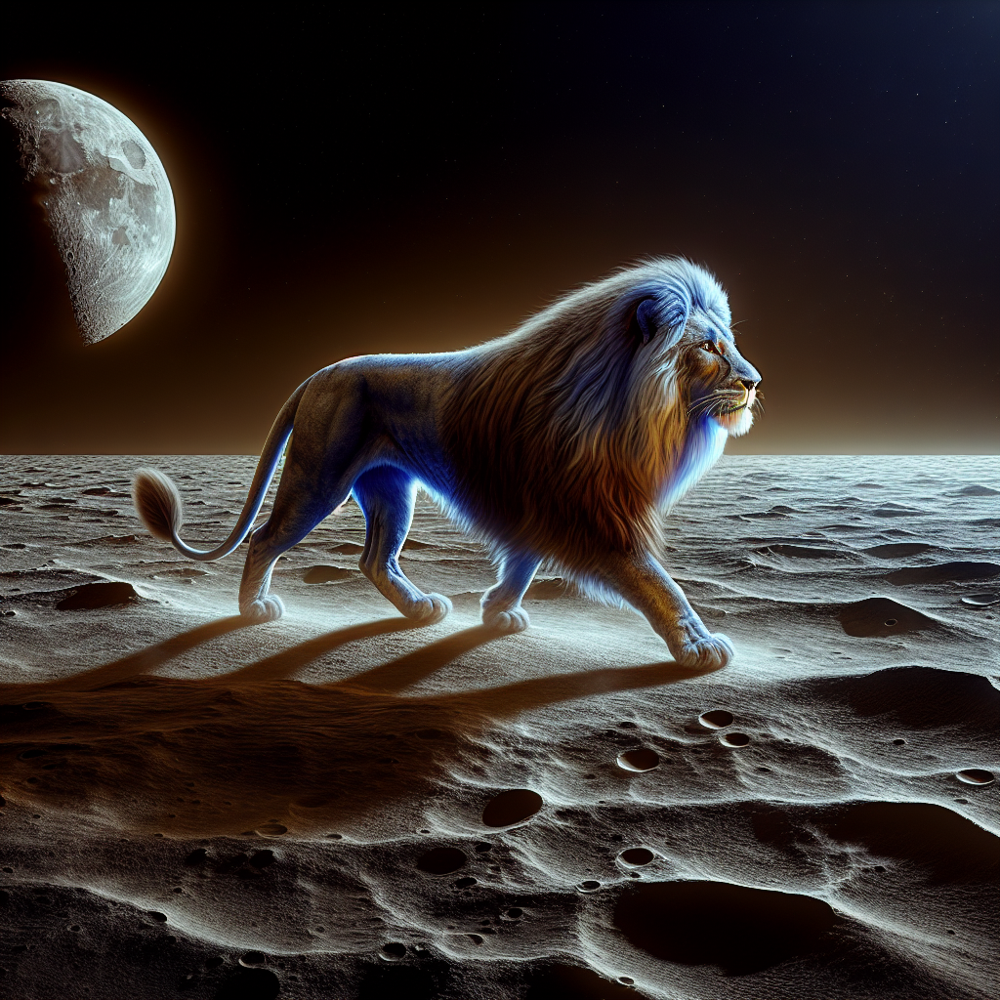

In [29]:
from google.colab.patches import cv2_imshow # for image display
from skimage import io



image = io.imread(image_url)
cv2_imshow(image)

### Save The Image to Drive

In [30]:
type(image)

numpy.ndarray

In [33]:
from PIL import Image as im
img = im.fromarray(image)
img.save("/content/drive/MyDrive/GENAI-LLM/Prompt engineering with API examples/lion.png") #convert the array to jpg and save it to drive

### Open The Image From Drive

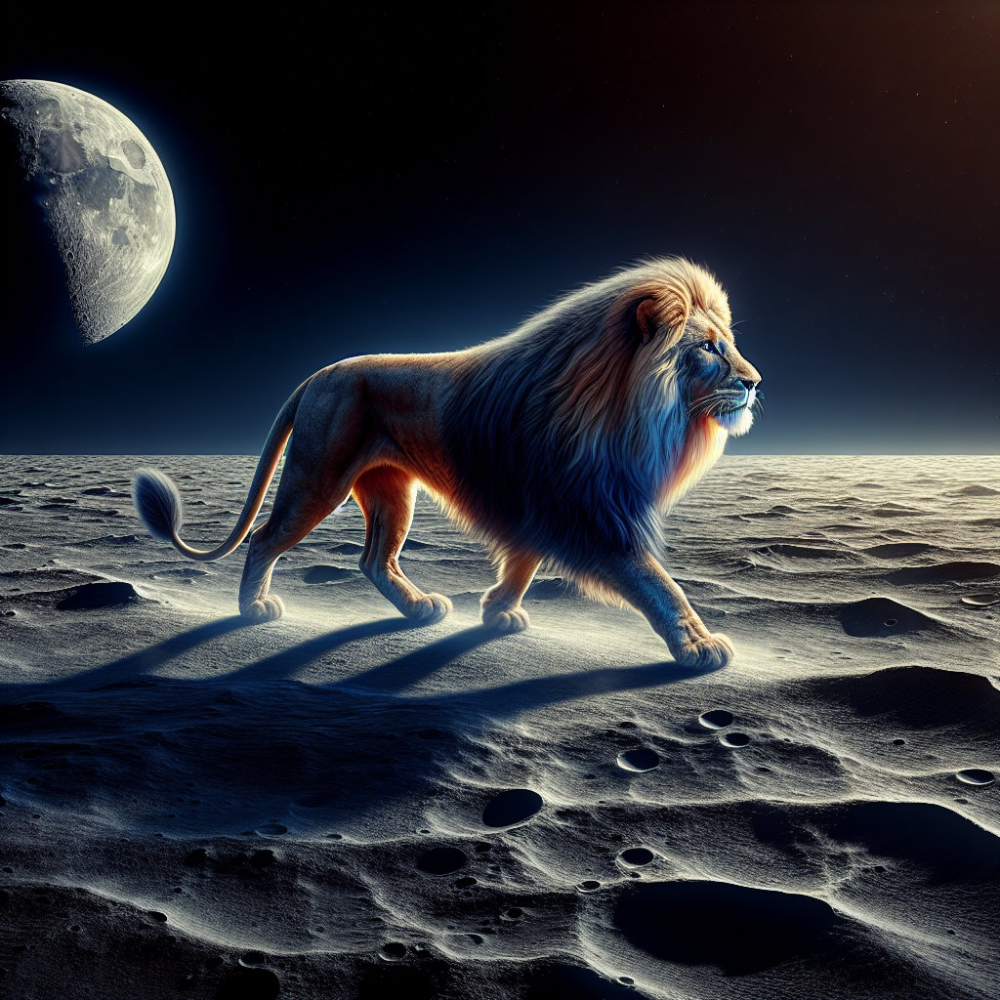

In [34]:
img_new = im.open("/content/drive/MyDrive/GENAI-LLM/Prompt engineering with API examples/lion.png")
img_new

## [Text To Image (Edits) ](https://platform.openai.com/docs/guides/images/edits-dall-e-2-only)

(281, 375)


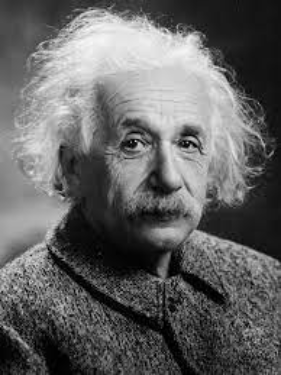

In [35]:
from PIL import Image as im
image = im.open("/content/drive/MyDrive/GENAI-LLM/Prompt engineering with API examples/Einstein.png")
print(image.size)
image


You can upload the image you want to this page via the [Editing Image](https://labs.openai.com/editor)  web page and mask the part of the image you want to change.

The uploaded image and mask must both be square PNG images less than 4MB in size, and also must have the same dimensions as each other.

The image edit feature is currently only available on the dall-e-2 model.

(281, 375)


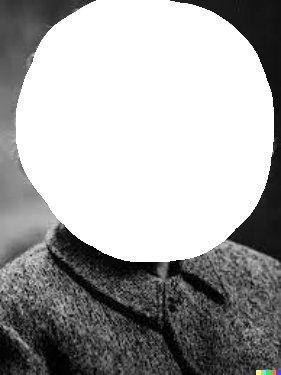

In [44]:
image = im.open("/content/drive/MyDrive/GENAI-LLM/Prompt engineering with API examples/Einstein_masked_new.png")
print(image.size)
image

In [46]:
response = client.images.edit(
    model = "dall-e-2",
    image = open("/content/drive/MyDrive/GENAI-LLM/Prompt engineering with API examples/Einstein.png", "rb"),
    mask = open("/content/drive/MyDrive/GENAI-LLM/Prompt engineering with API examples/Einstein_masked_new.png", "rb"),
    prompt = "portrait of a man with a very angry looking to his left",
    n = 1,
    size = "512x512" # 256x256, 1024x1024
)

image_url = response.data[0].url


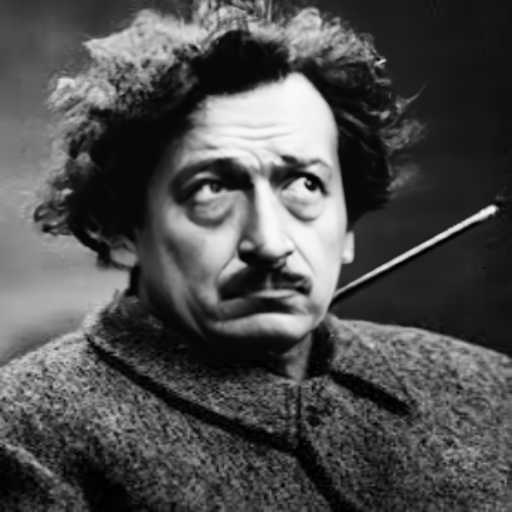

In [47]:
from google.colab.patches import cv2_imshow  # for image display
from skimage import io

image = io.imread(image_url)
cv2_imshow(image)

(1024, 1024, 3)


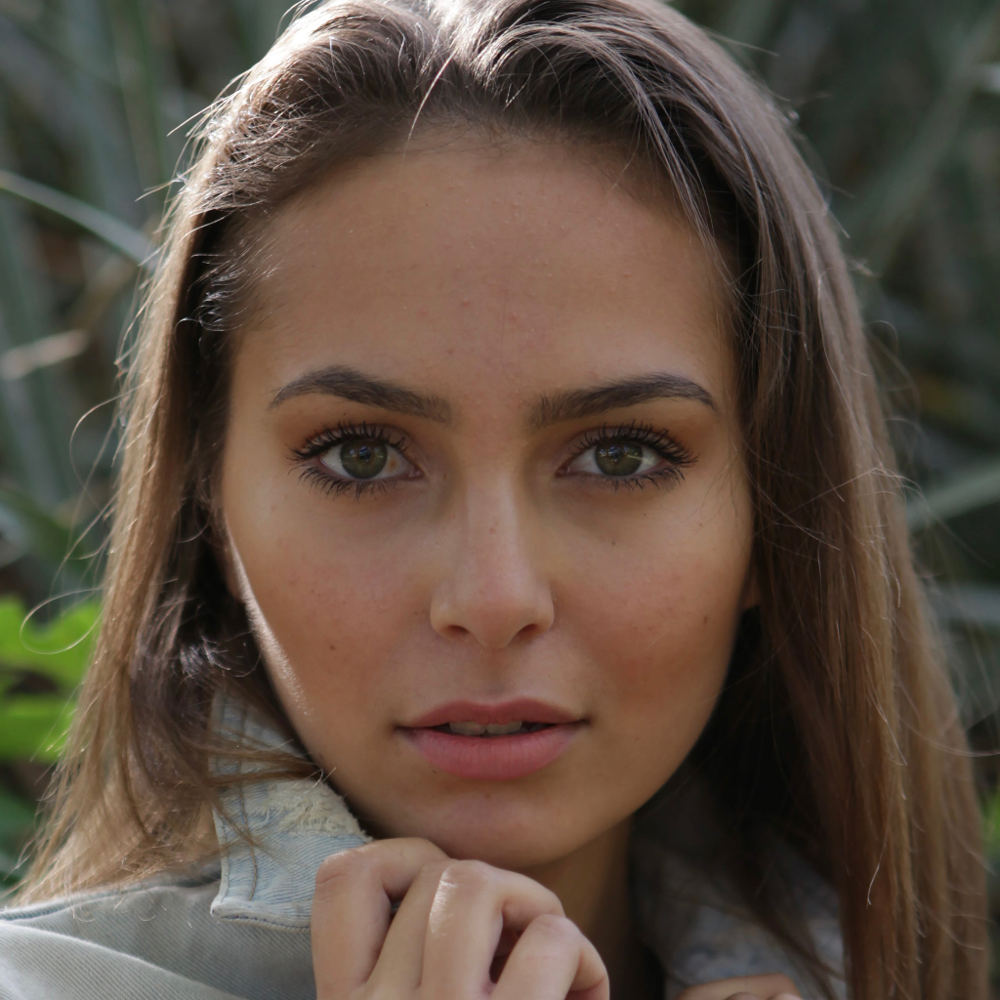

True

In [72]:
import cv2
image = cv2.imread("/content/drive/MyDrive/GENAI-LLM/Prompt engineering with API examples/orijinal.png")
image = cv2.resize(image, (1024, 1024))
print(image.shape)
cv2_imshow(image)
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGBA)
cv2.imwrite("/content/drive/MyDrive/GENAI-LLM/Prompt engineering with API examples/original1.png", image)


In [73]:
response = client.images.edit(
    model = "dall-e-2",
    image = open("/content/drive/MyDrive/GENAI-LLM/Prompt engineering with API examples/original1.png", "rb"),
    prompt = "this is a picture of a woman's face. You will retouch this image. Convert this image to a natural image without changing the face.",
    n = 1,
    size = "1024x1024"
)

image_url = response.data[0].url

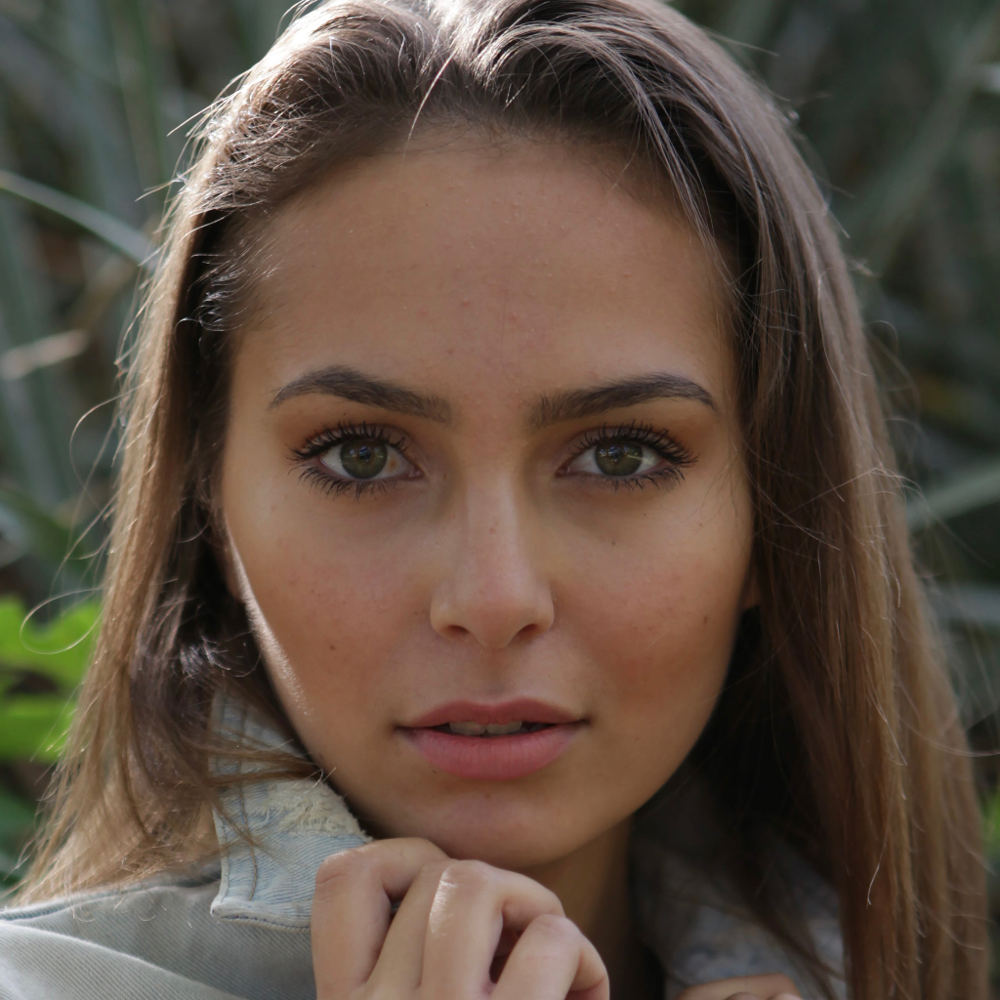

In [74]:
from google.colab.patches import cv2_imshow  # for image display
from skimage import io

image = io.imread(image_url)
cv2_imshow(image)

In [75]:
from PIL import Image as im
img = im.fromarray(image)
img.save("/content/drive/MyDrive/GENAI-LLM/Prompt engineering with API examples/natural.png") #convert the array to jpg and save it to drive

In [76]:
response = client.images.edit(
    model = "dall-e-2",
    image = open("/content/drive/MyDrive/GENAI-LLM/Prompt engineering with API examples/original1.png", "rb"),
    prompt = "this is a picture of a woman's face. You will retouch this image. Convert this image to a cute image without changing the face.",
    n = 1,
    size = "1024x1024"
)

image_url = response.data[0].url

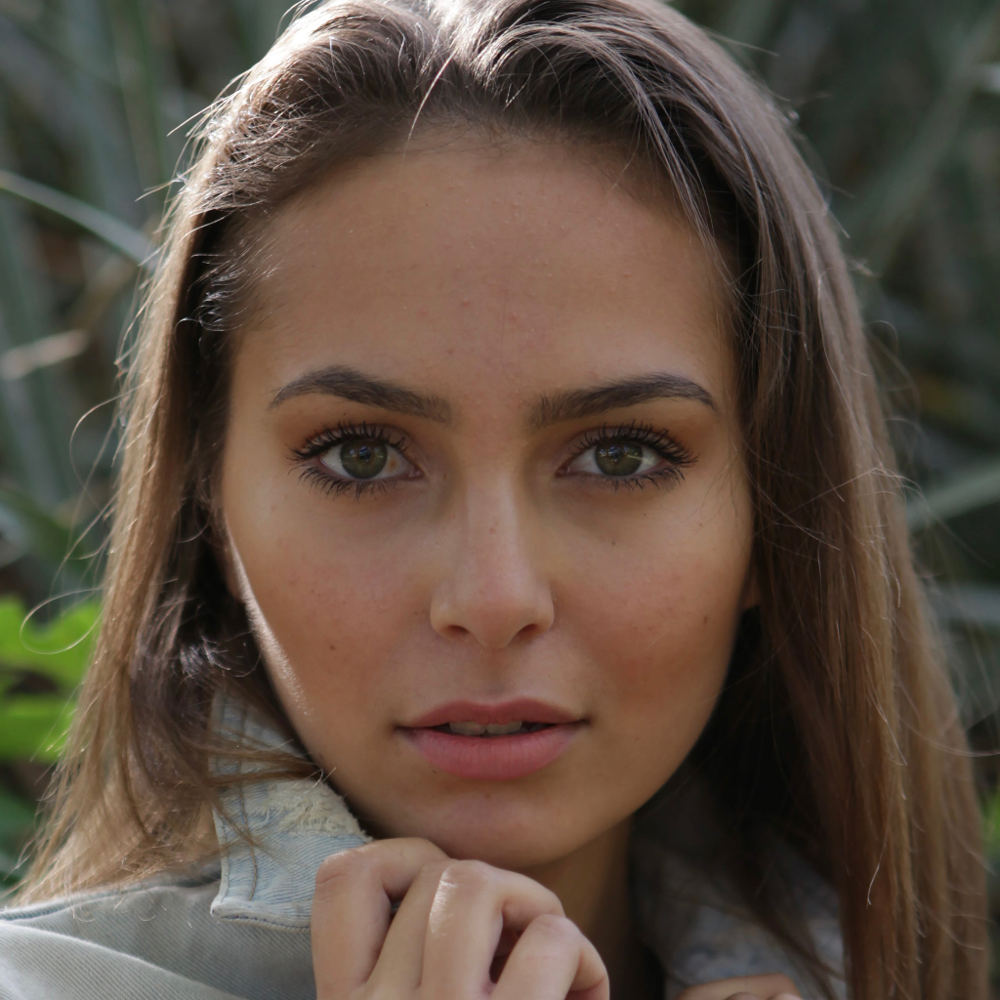

In [77]:
from google.colab.patches import cv2_imshow  # for image display
from skimage import io

image = io.imread(image_url)
cv2_imshow(image)

In [86]:
response = client.images.edit(
    model = "dall-e-2",
    image = open("/content/drive/MyDrive/GENAI-LLM/Prompt engineering with API examples/original1.png", "rb"),
    prompt = """Change woman's face with the following features:
    She has smooth, flawless skin, as if she has applied professional makeup.
    Her complexion is even and radiant, with no blemishes or imperfections.
    Her eyes are highlighted with subtle yet elegant makeup, and her lips have a soft, natural color.
    Her overall appearance is polished and refined, giving her a fresh and youthful look.
""",
    n = 1,
    size = "1024x1024"
)

image_url = response.data[0].url

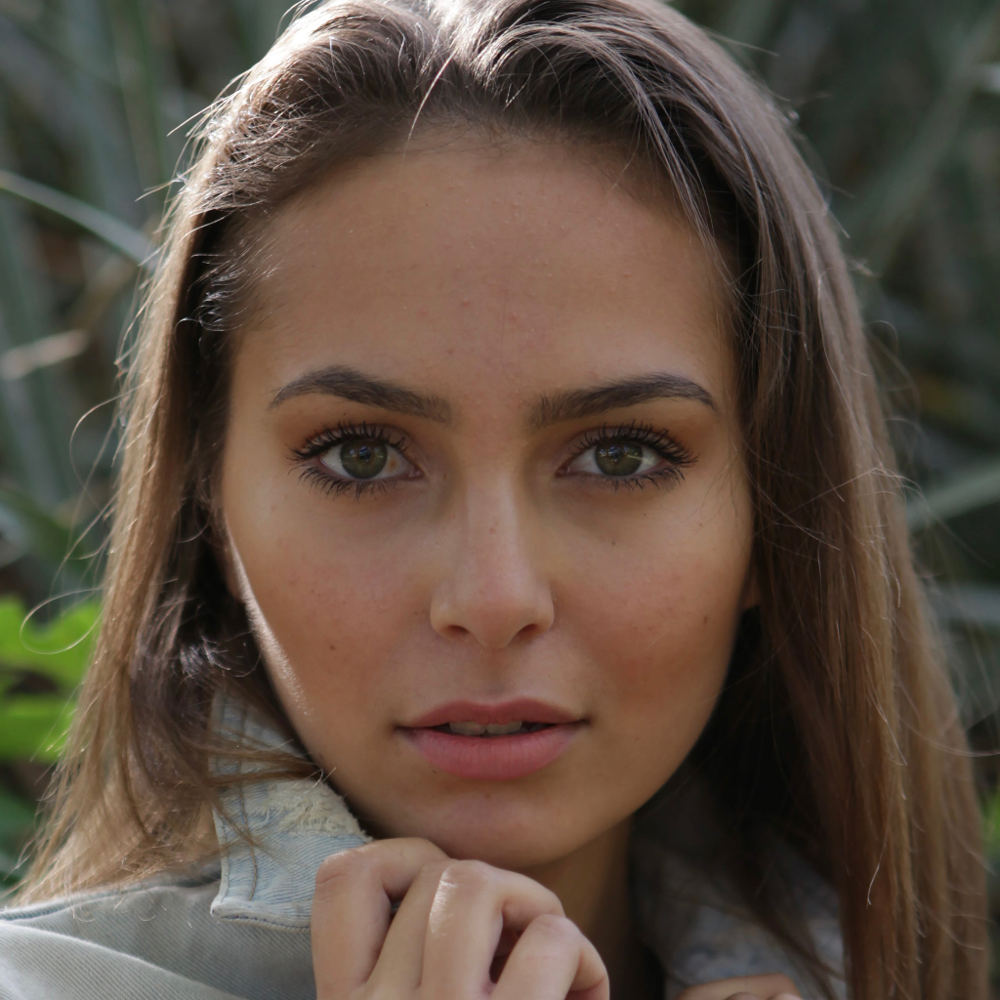

In [87]:
from google.colab.patches import cv2_imshow  # for image display
from skimage import io

image = io.imread(image_url)
cv2_imshow(image)

## [Image To Text (Vision)](https://platform.openai.com/docs/guides/vision)

In [51]:
!curl -o picture.jpg https://img.freepik.com/free-photo/painting-mountain-lake-with-mountain-background_188544-9126.jpg

  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
100 72387  100 72387    0     0   556k      0 --:--:-- --:--:-- --:--:--  561k


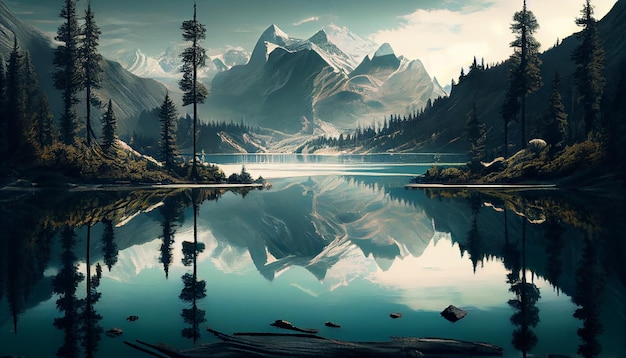

In [52]:
from PIL import Image as im
image = im.open('/content/picture.jpg')
image

In [53]:
url="https://img.freepik.com/free-photo/painting-mountain-lake-with-mountain-background_188544-9126.jpg"

In [54]:
response = client.chat.completions.create(
  model="gpt-4o",
  messages=[
    {
      "role": "user",
      "content": [
        {"type": "text", "text": "What’s in this image?"},
        {
          "type": "image_url",
          "image_url": {
            "url": url
          },
        },
      ],
    }
  ],
  max_tokens=300,
)

print(response.choices[0])

Choice(finish_reason='stop', index=0, logprobs=None, message=ChatCompletionMessage(content='This image depicts a serene, picturesque landscape with a calm lake reflecting the surrounding environment. The lake is encircled by evergreen trees and mountains in the distance. The sky is clear, with some clouds, and the entire scene has a symmetrical quality due to the reflection in the water, creating a mirror image of the mountains, trees, and sky. The overall mood of the image is peaceful and natural.', role='assistant', function_call=None, tool_calls=None))


In [55]:
Markdown(response.choices[0].message.content)

This image depicts a serene, picturesque landscape with a calm lake reflecting the surrounding environment. The lake is encircled by evergreen trees and mountains in the distance. The sky is clear, with some clouds, and the entire scene has a symmetrical quality due to the reflection in the water, creating a mirror image of the mountains, trees, and sky. The overall mood of the image is peaceful and natural.

In [56]:
!curl -o letter.png https://w7.pngwing.com/pngs/398/374/png-transparent-handwriting-letter-line-line-text-area-paper-product.png

  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
100  104k  100  104k    0     0   105k      0 --:--:-- --:--:-- --:--:--  105k


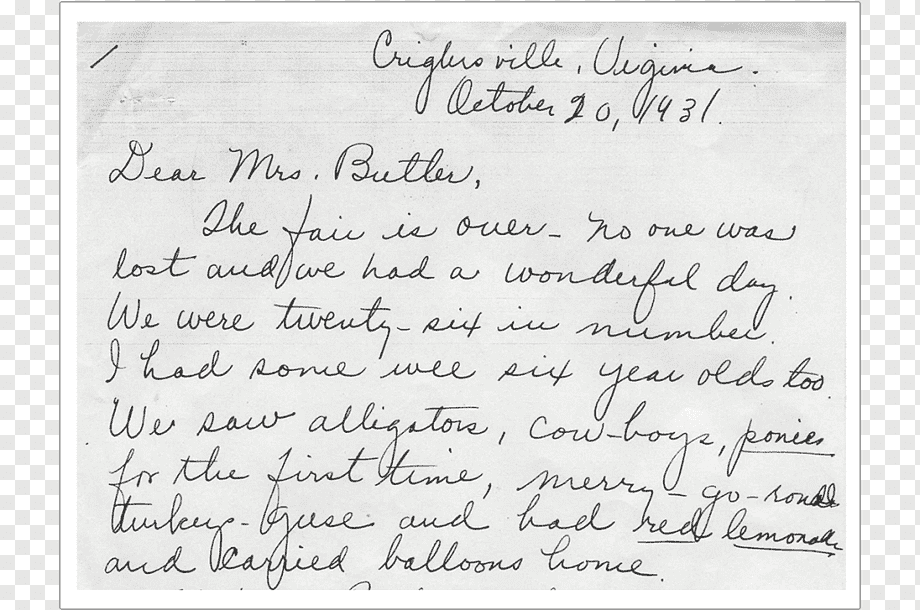

In [57]:
image = im.open('/content/letter.png')
image

In [58]:
url2="https://w7.pngwing.com/pngs/398/374/png-transparent-handwriting-letter-line-line-text-area-paper-product.png"

In [59]:
response = client.chat.completions.create(
  model="gpt-4o",
  messages=[
    {
      "role": "user",
      "content": [
        {"type": "text", "text": "Extract what is written in the image."},
        {
          "type": "image_url",
          "image_url": {
            "url": url2
          },
        },
      ],
    }
  ],
  max_tokens=300,
  temperature=0.0,
  top_p=1.0
)

print(response.choices[0])

Choice(finish_reason='stop', index=0, logprobs=None, message=ChatCompletionMessage(content='Creightonville, Virginia\nOctober 20, 1937\n\nDear Mrs. Butler,\n\nThe fair is over. No one was lost and we had a wonderful day. We were twenty-six in number. I had some wee six year olds too. We saw alligators, cow-boys, ponies for the first time, merry-go-round, turkey-goose and had red lemonade and carried balloons home.', role='assistant', function_call=None, tool_calls=None))


In [60]:
Markdown(response.choices[0].message.content)

Creightonville, Virginia
October 20, 1937

Dear Mrs. Butler,

The fair is over. No one was lost and we had a wonderful day. We were twenty-six in number. I had some wee six year olds too. We saw alligators, cow-boys, ponies for the first time, merry-go-round, turkey-goose and had red lemonade and carried balloons home.

## [Text To Speech](https://platform.openai.com/docs/guides/text-to-speech)

- The default response format is "mp3", but other formats like "opus", "aac", "flac", and "pcm" are available.

- Experiment with different voices (alloy, echo, fable, onyx, nova, and shimmer) to find one that matches your desired tone and audience.

In [89]:
response = client.audio.speech.create(
    model="tts-1", # tts-1-hd
    voice="alloy", # alloy, echo, fable, onyx, nova, and shimmer
    input="Hello world! This is a streaming test.",
    response_format="mp3", #"opus", "aac", "flac", and "pcm"
    speed=1.0 # normal speed is 1.0
)
speech_file_path = "/content/drive/MyDrive/GENAI-LLM/Prompt engineering with API examples/output.mp3"
response.stream_to_file(speech_file_path)

<ipython-input-89-02edf8da1e6a>:9: DeprecationWarning: Due to a bug, this method doesn't actually stream the response content, `.with_streaming_response.method()` should be used instead
  response.stream_to_file(speech_file_path)


In [90]:
# If the client.audio.speech.create method in the line above is deprecated, we can use it this way.
with client.audio.speech.with_streaming_response.create(
    model="tts-1-hd",
    voice="nova",
    input="""I see skies of blue and clouds of white
             The bright blessed days, the dark sacred nights
             And I think to myself
             What a wonderful world""",
    speed=1.0,
    response_format="mp3"
) as response:
    response.stream_to_file("speech.mp3")

In [93]:
with client.audio.speech.with_streaming_response.create(
    model="tts-1",
    voice="shimmer",
    input="""
    Ağlasam sesimi duyar mısınız, mısralarımda;
    Dokunabilir misiniz, gözyaşlarıma, ellerinizle?

    Bilmezdim şarkıların bu kadar güzel,
    Kelimelerinse kifayetsiz olduğunu
    Bu derde düşmeden önce.

    Bir yer var, biliyorum;
    Her şeyi söylemek mümkün;
    Epeyce yaklaşmışım, duyuyorum;
    Anlatamıyorum.""",
    speed=1.0
) as response:
    response.stream_to_file("/content/drive/MyDrive/GENAI-LLM/Prompt engineering with API examples/turkish_poem.mp3")

In [94]:
from IPython.display import Audio

Audio(filename="/content/drive/MyDrive/GENAI-LLM/Prompt engineering with API examples/turkish_poem.mp3")

In [95]:
Audio(filename="speech.mp3")

## [Speech To Text](https://platform.openai.com/docs/guides/speech-to-text)

File uploads are currently limited to 25 MB and the following input file types are supported: mp3, mp4, mpeg, mpga, m4a, wav, and webm.

In [96]:
from IPython.display import Markdown

audio_file= open("/content/speech.mp3", "rb") #mp3, mp4, mpeg, mpga, m4a, wav, and webm.
transcription = client.audio.transcriptions.create(
  model="whisper-1",
  file=audio_file
)
Markdown(transcription.text)

I see skies of blue and clouds of white, the bright blessed days, the dark sacred nights, and I think to myself, what a wonderful world.

In [97]:
audio_file= open("/content/drive/MyDrive/GENAI-LLM/Prompt engineering with API examples/turkish_poem.mp3", "rb")
transcription = client.audio.transcriptions.create(
  model="whisper-1",
  file=audio_file
)
Markdown(transcription.text)

Ağlasam sesimi duyar mısınız mısralarımda? Dokunabilir misiniz gözyaşlarıma ellerinizle? Bilmezdim şarkıların bu kadar güzel, Kelimelerinse kifayetsiz olduğunu. Bu derde düşmeden önce. Bir yer var, biliyorum. Her şeyi söylemek mümkün. Epeyce yaklaşmışım, duyuyorum, anlatamıyorum.

In [98]:
# It only translates supported languages to English. Does not translate to other languages
audio_file= open("/content/drive/MyDrive/GENAI-LLM/Prompt engineering with API examples/turkish_poem.mp3", "rb")
translation = client.audio.translations.create(
  model="whisper-1",
  file=audio_file,
  temperature=0.0
)
Markdown(translation.text)

If I cry, will you hear my voice in my tears? Can you touch my tears with your hands? I didn't know that my songs were so beautiful, that my words were insufficient. Before I fell into this trouble, There is a place, I know, It is possible to say everything, I have come quite close, I hear, I cannot explain.

In [99]:
# Using the chat model we created above, we translate the speech text into the language we want.

system="You will be provided with a sentence in English, and your task is to translate it into Turkish."

user=translation.text

chat_model(system, user, model="gpt-4o", max_tokens=512)

'Eğer ağlarsam, gözyaşlarımda sesimi duyacak mısın? Gözyaşlarıma ellerinle dokunabilir misin? Şarkılarımın bu kadar güzel olduğunu, kelimelerimin yetersiz olduğunu bilmiyordum. Bu belaya düşmeden önce, Bir yer var, biliyorum, Her şeyi söylemek mümkün, Oldukça yaklaştım, Duyuyorum, Anlatamıyorum.'

## [Embeddings](https://platform.openai.com/docs/guides/embeddings)

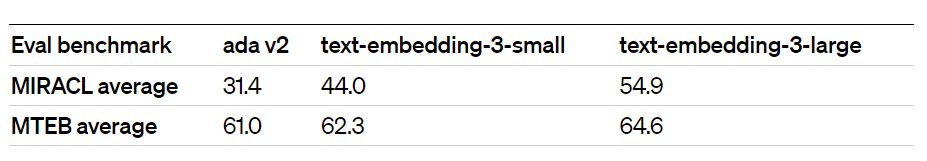

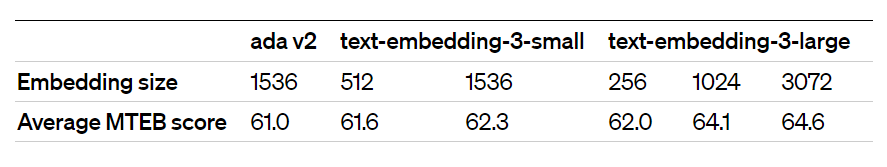

In [100]:
embeddings_1= client.embeddings.create(
                                      model="text-embedding-3-large",
                                      input="How old are you?",
                                      dimensions=3072)
embeddings_1

CreateEmbeddingResponse(data=[Embedding(embedding=[-0.016839688643813133, -0.002746195998042822, -0.02941131591796875, 0.019821858033537865, -0.018645405769348145, 0.0021904590539634228, -0.0033686214592307806, 0.0006891139782965183, 0.015417001210153103, 0.027865510433912277, -0.019767139106988907, -0.029712269082665443, 0.0006634645396843553, -0.004545073956251144, 0.03551245480775833, 0.06276237964630127, -0.0650058463215828, -0.011921842582523823, -0.051599759608507156, -0.01604626700282097, 0.05723578855395317, 0.010745389387011528, -0.024541348218917847, -0.007934215478599072, -0.005116201005876064, 0.02913772128522396, 0.023570090532302856, -0.020328005775809288, -0.03589548543095589, -0.009240624494850636, 0.006371311843395233, 0.028207503259181976, 0.008536120876669884, 0.0012337362859398127, -0.010266601108014584, 0.005423993803560734, -0.014322626404464245, -0.020505841821432114, 0.007941055111587048, 0.03045097179710865, 0.0067714424803853035, 0.031517986208200455, -0.03102

In [101]:
embeddings_1.data[0].embedding[:10]

[-0.016839688643813133,
 -0.002746195998042822,
 -0.02941131591796875,
 0.019821858033537865,
 -0.018645405769348145,
 0.0021904590539634228,
 -0.0033686214592307806,
 0.0006891139782965183,
 0.015417001210153103,
 0.027865510433912277]

In [102]:
embeddings_2= client.embeddings.create(
                                      model="text-embedding-3-large",
                                      input="What is your age?",
                                      dimensions=3072)
embeddings_2.data[0].embedding

[-0.005837408825755119,
 -0.010058769024908543,
 -0.025781260803341866,
 0.006702070590108633,
 -0.020162848755717278,
 0.0018567567458376288,
 -0.010912103578448296,
 0.004821714945137501,
 0.014461369253695011,
 0.03461666405200958,
 -0.039963219314813614,
 -0.04219850152730942,
 -0.007966968230903149,
 0.0013583492254838347,
 0.010005908086895943,
 0.0665147453546524,
 -0.024633413180708885,
 -0.009522603824734688,
 -0.034737490117549896,
 -0.011282132938504219,
 0.05878187716007233,
 0.005920476745814085,
 -0.036882154643535614,
 -0.01126702968031168,
 0.0008165198378264904,
 0.04836063086986542,
 0.007657351437956095,
 0.007800832390785217,
 -0.00755162863060832,
 -0.011131100356578827,
 0.0040627759881317616,
 0.016779718920588493,
 0.018803555518388748,
 0.026173945516347885,
 0.020087331533432007,
 0.0026185272727161646,
 -0.0101191820576787,
 -0.00734395906329155,
 0.02260957658290863,
 0.019966505467891693,
 -0.0022938072215765715,
 0.020162848755717278,
 -0.03899661079049110

In [103]:
from sklearn.metrics.pairwise import cosine_similarity

cosine_similarity([embeddings_1.data[0].embedding], [embeddings_2.data[0].embedding])

array([[0.7346044]])